&copy; 2025 by Deitel & Associates, Inc. All Rights Reserved. https://deitel.com

<hr/>

In [1]:
%%html
<style>
    h1 {color:#BB0000}
    h2 {color:purple}
    h3 {color:#0099ff}
    hr {    
        border: 0;
        height: 3px;
        background: #333;
        background-image: linear-gradient(to right, #ccc, black, #ccc);
    }
</style>

<hr/>

# Text Generation Via the Responses API
## Text Summarization
### Creating the `OpenAI` Client Object

In [1]:
from openai import OpenAI 

In [2]:
client = OpenAI()

* If you store your key elsewhere, such as in a file
>```python
> import keys
> client = OpenAI(api_key=keys.OPENAI_API_KEY)
>```

* Assumes your API key is in the environment variable `OPENAI_API_KEY`
* If you used a different environment variable name, replace with preceding statement with
> `client = OpenAI(api_key=os.environ.get("CUSTOM_ENV_NAME"))`

<hr/>

### Loading the Presentation Transcript

In [3]:
from pathlib import Path

In [5]:
transcript_path = Path('resources') / 'transcript.txt' 

In [6]:
transcript = transcript_path.read_text()

### Requesting a Response That Produces a Summary Abstract Paragraph

In [7]:
model_instructions = """Given a Python technical presentation's
    transcript, create a summary abstract paragraph. Use 
    straightforward sentences. Spell language features and 
    function names correctly. Avoid abbreviations. Do not refer 
    to the speaker."""

In [8]:
response = client.responses.create(model='gpt-5-mini', 
    instructions=model_instructions, input=transcript)

### Displaying the Response

In [9]:
print(response.output_text)

This lesson introduces interactive and script-based ways to run Python code and the notebook document workflow. The IPython interactive interpreter accepts small code snippets that are read, evaluated, printed if they produce results, and then the loop repeats, providing an effective environment for exploration and experimentation. Script mode runs complete Python programs stored in .py files, which can define libraries of functions and classes for reuse. Jupyter Notebook documents (.ipynb) combine executable code with descriptive text, images, and multimedia so analyses and stepwise machine learning or visualization workflows can be packaged and shared. The JupyterLab interface provides an integrated development environment backed by a local or remote server and supports multiple language kernels, including Julia, Python, and R, with many additional kernels available. Demonstrations include creating a Matplotlib visualization of simulated die rolls and running notebooks in cloud servi

### Extracting Key Points

In [10]:
model_instructions = """Given a Python technical presentation's
    transcript, present a numbered list of the top 5 key points. 
    Use concise, direct sentences and avoid abbreviations.""" 

In [11]:
response = client.responses.create(model='gpt-5-mini', 
    instructions=model_instructions, input=transcript)

In [12]:
print(response.output_text)

1. IPython interactive mode lets you enter small Python snippets that are read, evaluated, printed if they have a result, and then awaited again, making it ideal for learning and exploratory data analysis.  
2. IPython script mode runs full Python programs stored in .py files, which can define reusable functions and classes and produce complete applications or visualizations.  
3. Jupyter Notebook files (.ipynb) are documents that combine narrative text, images, videos, and executable code so you can present analysis, explanations, and results together.  
4. Jupyter supports many programming languages via kernels, and the JupyterLab interface provides an integrated development environment for editing and running notebooks and .py files locally or in the cloud.  
5. Google Colab is a web-based, Jupyter-compatible service that runs notebooks in the cloud without local installation, supports sharing via Google Drive, and offers free or paid compute for tasks such as machine learning.


### Markdown-Formatted Responses

In [13]:
import IPython
IPython.display.Markdown(response.output_text)

1. IPython interactive mode lets you enter small Python snippets that are read, evaluated, printed if they have a result, and then awaited again, making it ideal for learning and exploratory data analysis.  
2. IPython script mode runs full Python programs stored in .py files, which can define reusable functions and classes and produce complete applications or visualizations.  
3. Jupyter Notebook files (.ipynb) are documents that combine narrative text, images, videos, and executable code so you can present analysis, explanations, and results together.  
4. Jupyter supports many programming languages via kernels, and the JupyterLab interface provides an integrated development environment for editing and running notebooks and .py files locally or in the cloud.  
5. Google Colab is a web-based, Jupyter-compatible service that runs notebooks in the cloud without local installation, supports sharing via Google Drive, and offers free or paid compute for tasks such as machine learning.

## Sentiment Analysis

In [14]:
model_instructions = """You are a sentiment-analysis expert. 
    Determine the provided transcript's sentiment. 
    Explain your analysis."""

In [15]:
response = client.responses.create(model='gpt-5-mini', 
    instructions=model_instructions, input=transcript)

In [16]:
print(response.output_text)

Sentiment: Mildly positive / informative

Score (approx.): +0.6 on a -1.0 (very negative) to +1.0 (very positive) scale

Why:
- The tone is primarily educational and promotional rather than emotional or critical. It aims to inform and encourage use of IPython/Jupyter.
- Positive lexical cues and endorsements: phrases like "great way to learn Python," "really powerful visualization library," "nice die-rolling visualization," "nice thing about Jupyter Notebooks," and "fully compatible" convey approval and enthusiasm.
- The speaker highlights benefits and practical options (local/cloud use, Google CoLab, free tier), reinforcing a helpful, encouraging stance.
- There are no negative words, criticisms, or expressions of frustration; the language is neutral-to-optimistic and focused on capabilities and use cases.

Overall: an instructional passage with a mildly positive, encouraging sentiment.


In [17]:
IPython.display.Markdown(response.output_text)

Sentiment: Mildly positive / informative

Score (approx.): +0.6 on a -1.0 (very negative) to +1.0 (very positive) scale

Why:
- The tone is primarily educational and promotional rather than emotional or critical. It aims to inform and encourage use of IPython/Jupyter.
- Positive lexical cues and endorsements: phrases like "great way to learn Python," "really powerful visualization library," "nice die-rolling visualization," "nice thing about Jupyter Notebooks," and "fully compatible" convey approval and enthusiasm.
- The speaker highlights benefits and practical options (local/cloud use, Google CoLab, free tier), reinforcing a helpful, encouraging stance.
- There are no negative words, criticisms, or expressions of frustration; the language is neutral-to-optimistic and focused on capabilities and use cases.

Overall: an instructional passage with a mildly positive, encouraging sentiment.

## Accessible Image Descriptions

In [18]:
from describe_image import describe_image

### Getting an Accessible Description of a Scenic Aruba Sunset Photo
<img src="./resources/sunset.jpg" width="75%"/>

In [19]:
description = describe_image(client,
    'Provide an accessible description of this Aruba sunset.', 
    Path('resources') / 'sunset.jpg')

In [20]:
print(description)

Short alt text (one line):
A golden Aruba sunset: the sun sinks behind low clouds above a calm sea, casting a bright vertical reflection and silhouetting a small buoy.

Extended accessible description:
Framed horizontally, the scene shows a late-day sunset over the open Caribbean Sea in Aruba. The sun sits just above the horizon near the center of the image, partially obscured by a thick, low cloud whose silver‑lined edges glow with intense yellow and orange light. Surrounding the sun, the sky is filled with layers of warm tones — deep gold, amber, and softer orange — fading into paler yellow toward the top edges. Scattered midlevel clouds, darker gray to charcoal on their shaded sides, float across the sky and pick up warm highlights where the sun strikes them.

A straight, dark horizon line separates sky from water about one-third up from the bottom of the frame. The sea below is relatively calm and appears as a textured band of deep blue-gray that reflects the sunset’s color. A brig

In [21]:
IPython.display.Markdown(description)

Short alt text (one line):
A golden Aruba sunset: the sun sinks behind low clouds above a calm sea, casting a bright vertical reflection and silhouetting a small buoy.

Extended accessible description:
Framed horizontally, the scene shows a late-day sunset over the open Caribbean Sea in Aruba. The sun sits just above the horizon near the center of the image, partially obscured by a thick, low cloud whose silver‑lined edges glow with intense yellow and orange light. Surrounding the sun, the sky is filled with layers of warm tones — deep gold, amber, and softer orange — fading into paler yellow toward the top edges. Scattered midlevel clouds, darker gray to charcoal on their shaded sides, float across the sky and pick up warm highlights where the sun strikes them.

A straight, dark horizon line separates sky from water about one-third up from the bottom of the frame. The sea below is relatively calm and appears as a textured band of deep blue-gray that reflects the sunset’s color. A bright, narrow vertical streak of reflected light runs from the sun down across the water toward the foreground, creating a shimmering pathway. Near the bottom center of the image a small round buoy is visible as a dark silhouette against the lighter reflection. Along the far right of the lower edge a short dark shoreline or rocky outcrop is hinted at in silhouette.

Overall impression and mood:
The composition emphasizes warmth and peacefulness — the intense golden glow of the sky contrasts with the cool, quiet surface of the ocean. The partially hidden sun, the glowing cloud edges, and the glittering reflection draw the eye to the center, giving a feeling of calm and quiet conclusion to the day.

### Getting an Accessible Description of a Word Cloud
<img src="./resources/RomeoAndJulietHeart.png" width="75%"/>

In [22]:
description = describe_image(client,
    """Provide an accessible description of this 
    Romeo and Juliet word cloud.""", 
    Path('resources') / 'RomeoAndJulietHeart.png')

In [23]:
print(description)

Short summary
- A heart-shaped word cloud on a white background made from words and names drawn from Shakespeare’s Romeo and Juliet. Words vary by size, color, and orientation so that the largest and most frequent words form the visual focus.

Long description and layout details
- Overall shape and style: The words are arranged to form a symmetric heart, widest across the top and tapering to a point at the bottom. Most words are horizontal, but a few run vertically. Colors used are mostly purples, teals (blue-greens), bright lime greens, and small accents of yellow. Font sizes range from very large (dominant) to very small (background filler).

- Most prominent (largest) words and their approximate positions:
  - ROMEO — very large, center-left of the heart, dark purple, all caps.
  - JULIET — also very large, centered just below and slightly left of ROMEO, teal/blue-green, all caps.
  - LOVE — large, center-right of the heart, dark blue/purple.
  - THEE — large, upper-left lobe of the

In [24]:
IPython.display.Markdown(description)

Short summary
- A heart-shaped word cloud on a white background made from words and names drawn from Shakespeare’s Romeo and Juliet. Words vary by size, color, and orientation so that the largest and most frequent words form the visual focus.

Long description and layout details
- Overall shape and style: The words are arranged to form a symmetric heart, widest across the top and tapering to a point at the bottom. Most words are horizontal, but a few run vertically. Colors used are mostly purples, teals (blue-greens), bright lime greens, and small accents of yellow. Font sizes range from very large (dominant) to very small (background filler).

- Most prominent (largest) words and their approximate positions:
  - ROMEO — very large, center-left of the heart, dark purple, all caps.
  - JULIET — also very large, centered just below and slightly left of ROMEO, teal/blue-green, all caps.
  - LOVE — large, center-right of the heart, dark blue/purple.
  - THEE — large, upper-left lobe of the heart, bright yellow-green.
  - NURSE — large, upper-left lobe above THEE, dark purple.
  - O — large, near the top-right lobe, teal (stands alone as the exclamatory “O” used in Shakespeare).
  - TYBALT — large, upper-right, green.
  - MERCUTIO — tall and vertical along the right side, dark purple.
  - CAPULET / LADY CAPULET — visible near the top-mid and left areas in green/teal tones.
  - FRIAR / LAWRENCE (drawn together) — medium-large, near the center in green.
  - WILL — medium-large, centered toward the bottom of the heart, blue.
  - BENVOLIO — medium, near the lower center, teal.

- Examples of medium and smaller words scattered through the cloud:
  - come, see, may, make, give, hath, well, dead, death, night, day, now, heart, eye, good, sir, man, Montague, Paris, Mantua, Verona, servant, cousin, father, mother, fair, poison, letter, grief, sleep, banished.
  - These smaller words fill gaps around the major names and emotional words, so the eye reads a network of character names, verbs, and nouns associated with the play.

- Visual impression and meaning
  - The largest words emphasize the protagonists (ROMEO and JULIET) and central themes (LOVE, THEE, O), while the surrounding character names (NURSE, TYBALT, MERCUTIO, CAPULET, FRIAR LAWRENCE, BENVOLIO, Montague, Paris) and verbs/nouns (death, dead, give, heart, night) reinforce the play’s mix of romance and tragedy. The multicolored palette and heart shape give an overall romantic look with darker-colored words providing contrast.

Suggested short alt text (for brief use)
- Heart-shaped word cloud of Romeo and Juliet terms with large words ROMEO, JULIET, LOVE, THEE, NURSE, TYBALT, MERCUTIO, CAPULET, and FRIAR LAWRENCE; many smaller words from the play (death, night, heart, Montague, Benvolio, etc.) fill the shape in purple, teal, green, and yellow.

### Function `describe_image` from `describe_image.py`
### Creating the Image’s URL
> `data:image/`_imageFormat_`;base64,`_base64EncodedImageString_
### Instructions for the Model
### Passing the Image to the Responses API to Get an Accessible Description

## Language Detection and Translation

### Translate English to Spanish and Japanese
* Automatically figures out source language

In [25]:
from translate import translate

In [26]:
english_text = (
    'Today was a beautiful day. Tomorrow looks like bad weather.')

In [27]:
spanish_text = translate(client, english_text, 'Spanish')
spanish_text

'Hoy fue un día hermoso. Mañana parece que habrá mal tiempo.'

In [28]:
japanese_text = translate(client, english_text, 'Japanese')
japanese_text

'今日は素晴らしい一日だった。明日は天気が悪くなりそうだ。'

### Translating Spanish and Japanese Back to English

In [29]:
translate(client, spanish_text, 'English')

'Today was a beautiful day. Tomorrow it looks like there will be bad weather.'

In [30]:
translate(client, japanese_text, 'English')

'Today was a wonderful day. It looks like the weather will be bad tomorrow.'

## Code Generation

In [31]:
response = client.responses.create(    
    model='gpt-5',    
    instructions='You are an expert Python programmer.',    
    input="""Write Python code that generates a word cloud from
        the top 200 words in 'RomeoAndJuliet.txt'. Use a white 
        background and colors with good contrast for web 
        accessibility. Remove modern English and Old English
        stop words, including words formed by splitting 
        contractions such as 'd', 's', and 'll'. Use the mask 
        image 'mask_heart.png'. The required files are located 
        in the current folder's 'resources' subfolder. Save the 
        image as 'RomeoAndJuliet.png' in that folder's 'outputs'
        subfolder then display it. Minimize use of custom code. 
        Return only the code with no markdown formatting. 
        Use a maximum code line length of 74 characters."""
)

In [32]:
print(response.output_text)

from pathlib import Path
import numpy as np
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

res_dir = Path('resources')
out_dir = Path('outputs')
out_dir.mkdir(parents=True, exist_ok=True)

text_path = res_dir / 'RomeoAndJuliet.txt'
mask_path = res_dir / 'mask_heart.png'
out_path = out_dir / 'RomeoAndJuliet.png'

text = text_path.read_text(encoding='utf-8', errors='ignore')
mask = np.array(Image.open(mask_path).convert('L'))

stopwords = set(STOPWORDS)
stopwords.update({
    'd', 's', 'll',
    'thou', 'thee', 'thy', 'thine', 'ye',
    'hath', 'doth', 'dost', 'hast', 'hadst',
    'art', 'wert', 'wilt', 'shalt',
    'shouldst', 'wouldst', 'couldst',
    'methinks', 'ere', 'nay', 'ay', 'oft',
    'whence', 'hence', 'thence',
    'whither', 'hither', 'thither',
    'wherefore', 'tis', 'twas', 'oer',
    'naught', 'aught', 'prithee', 'anon'
})

wc = WordCloud(
    width=1200,
    height=800,
    background_color='white',
    mask=mask,
    

### Executing the Generated Code

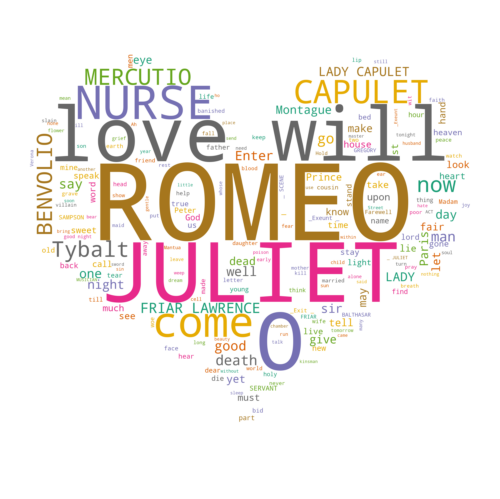

In [33]:
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

res = Path('resources')
text_path = res / 'RomeoAndJuliet.txt'
mask_path = res / 'mask_heart.png'
out_dir = res / 'outputs'
out_dir.mkdir(parents=True, exist_ok=True)
out_path = out_dir / 'RomeoAndJuliet.png'

text = text_path.read_text(encoding='utf-8')

stopwords = set(STOPWORDS)
stopwords.update({
    'thou', 'thee', 'thy', 'thine', 'ye', 'hath', 'hast', 'doth',
    'dost', 'art', 'ere', 'nay', 'ay', 'yea', 'oft', 'wilt',
    'shalt', 'shouldst', 'wouldst', 'canst', 'couldst', 'mayst',
    'mightst', 'wert', 'whence', 'whither', 'hither', 'thither',
    'wherefore', 'tis', 'twas', "e'en", "e'er", "o'er", 'thyself',
    'prithee', 'anon', 'naught', 'aught', 'sirrah', 'marry', 'saith',
    'd', 's', 'll', 're', 've', 'm', 't'
})

mask_img = np.array(Image.open(mask_path))

wc = WordCloud(
    background_color='white',
    max_words=200,
    mask=mask_img,
    colormap='Dark2',
    stopwords=stopwords
).generate(text)

wc.to_file(str(out_path))

plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Named Entity Recognition (NER) and Structured Outputs
### JSON Output for Named Entities
We’d like the Responses API to return its response in the JSON format shown below: 
```json
{
   "entities": [
      {
         "text": "Entity name",
         "tag": "Entity type"
      }
   ]
}
```

### Loading the Text

In [34]:
path = Path('resources') / 'web.txt'

In [35]:
text = path.read_text()

In [36]:
text

'The World Wide Web (simply called "the web") is a collection of hardware and software associated with the Internet that allows computer users to locate and view documents (with various combinations of text, graphics, animations, audios and videos) on almost any subject. In 1989, Tim Berners-Lee of CERN (the European Organization for Nuclear Research) began developing HyperText Markup Language (HTML)—the technology for sharing information via "hyperlinked" text documents. He also wrote communication protocols such as HyperText Transfer Protocol (HTTP) to form the backbone of his new hypertext information system, which he referred to as the World Wide Web. In 1994, Berners-Lee founded the World Wide Web Consortium (W3C, https://www.w3.org), which was devoted to developing web technologies. A key W3C goal is to make the web universally accessible to everyone regardless of disabilities, language or culture.'

### Performing NER on the Loaded Text

In [37]:
response = client.responses.create(
    model='gpt-5-mini',
    instructions="""You are an expert in named entity 
        recognition with the OntoNotes Named Entity Tag Set.""",
    input="""Analyze the supplied text and extract its named
        entities. Return only JSON in the following format:
            {
              "entities": [
                {
                  "text": "Entity name",
                  "tag": "Entity type"
                }
              ]
            }   
        Text to analyze:
        """ + text
)

### Deserializing the response 

In [38]:
import json

In [39]:
json_response = json.loads(response.output_text)

In [40]:
print(json.dumps(json_response, indent=2))

{
  "entities": [
    {
      "text": "The World Wide Web",
      "tag": "PRODUCT"
    },
    {
      "text": "the web",
      "tag": "PRODUCT"
    },
    {
      "text": "Internet",
      "tag": "ORG"
    },
    {
      "text": "1989",
      "tag": "DATE"
    },
    {
      "text": "Tim Berners-Lee",
      "tag": "PERSON"
    },
    {
      "text": "CERN",
      "tag": "ORG"
    },
    {
      "text": "the European Organization for Nuclear Research",
      "tag": "ORG"
    },
    {
      "text": "HyperText Markup Language",
      "tag": "LANGUAGE"
    },
    {
      "text": "HTML",
      "tag": "LANGUAGE"
    },
    {
      "text": "HyperText Transfer Protocol",
      "tag": "PRODUCT"
    },
    {
      "text": "HTTP",
      "tag": "PRODUCT"
    },
    {
      "text": "World Wide Web Consortium",
      "tag": "ORG"
    },
    {
      "text": "W3C",
      "tag": "ORG"
    },
    {
      "text": "1994",
      "tag": "DATE"
    }
  ]
}


# Speech Synthesis and Speech Recognition
## English Speech-to-Text for Audio Transcription

In [4]:
from speech_to_text import speech_to_text

In [5]:
audio_path = Path('resources') / '02_00.m4a'

In [42]:
audio_path = Path('resources') / 'Python2e_01_02.m4a'

In [6]:
transcript = speech_to_text(client, audio_path)

In [7]:
transcript

"Welcome to Lesson 2, Intro to Java Programming.\nIn this lesson, and in fact in all of the lessons, I'll be compiling and running Java programs just like I showed you in the Lesson 1 test drive of the Java Development Kit.\nHowever, my general approach throughout these videos will be to bring a program up on the screen inside of Microsoft's cross-platform Visual Studio Code Editor.\nI'll be using that to present the code to you.\nI will run the code, sometimes directly from the Visual Studio Code Editor, and sometimes by going out to the command line on macOS or Windows like I did back in the Lesson 1 test drive.\nAnd then we'll see how the program runs.\nAnd after I've shown you how the program runs, I'll go ahead and talk about the code that achieved those results.\nIn this particular lesson, we're going to be working with a lot of Java fundamentals.\nSo we'll talk about input and output statements.\nAnd input statements will enable us to bring data into a program so that we can use

## Text-to-Speech

### Synthesizing and Playing English Speech in a Happy Tone

In [45]:
from text_to_speech import text_to_speech

In [46]:
english_text = (
    'Today was a beautiful day. Tomorrow looks like bad weather.')

In [47]:
english_happy_path = (Path('resources') / 'outputs' / 
    'english_happy.mp3')

In [48]:
text_to_speech(client, text=english_text, 
    path=english_happy_path, voice='ash', 
    instructions='Speak in a happy tone.')

In [49]:
from playsound import playsound

In [50]:
playsound(str(english_happy_path)) # autoplays the audio

In [51]:
IPython.display.Audio(filename=english_happy_path) # displays an audio player

### Synthesizing and Playing English Speech in an Evil Tone

In [52]:
english_evil_path = (Path('resources') / 'outputs' / 
    'english_evil.mp3')

In [53]:
text_to_speech(client, text=english_text, 
    path=english_evil_path, voice='ash',
    instructions="""Speak as an evil supervillain and 
        end with an evil laugh.""")

In [54]:
playsound(str(english_evil_path))

In [55]:
IPython.display.Audio(filename=english_evil_path)

### Synthesizing and Playing Spanish Speech 

In [56]:
spanish_path = Path('resources') / 'outputs' / 'spanish.mp3'

In [57]:
text_to_speech(client, text=spanish_text, 
    path=spanish_path, voice='ash')

In [58]:
playsound(str(spanish_path))

In [59]:
IPython.display.Audio(filename=spanish_path)

### Synthesizing and Playing Japanese Speech

In [60]:
japanese_path = Path('resources') / 'outputs' / 'japanese.mp3'

In [61]:
text_to_speech(client, text=japanese_text, 
    path=japanese_path, voice='ash')

In [62]:
playsound(str(japanese_path))

In [63]:
IPython.display.Audio(filename=japanese_path)

# Image Generation


In [64]:
from create_image import create_image

In [65]:
anime_path = (Path('resources') / 'outputs' / 
    'havanese_anime.png')

In [66]:
create_image(client, anime_path,
    """Havanese dog as a Japanese anime character
    in neon colors against a black background""")

Image stored in:
resources/outputs/havanese_anime.png


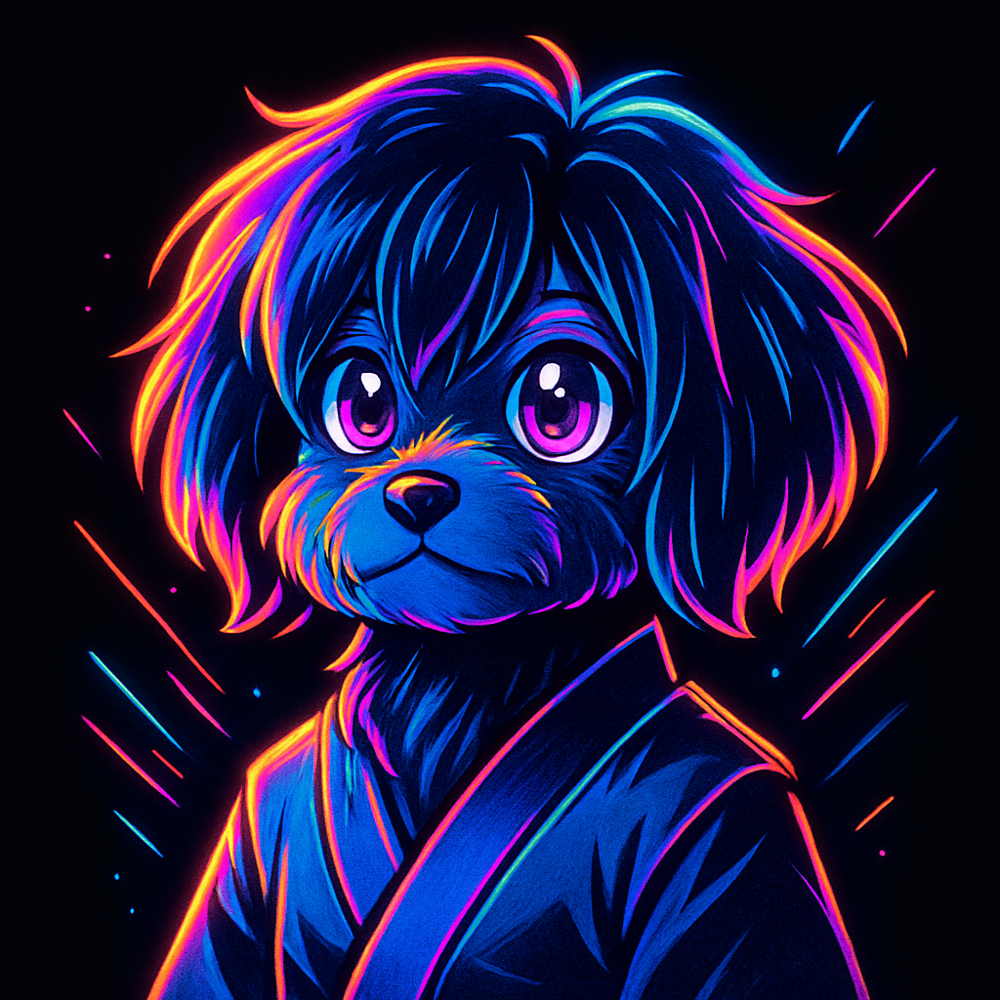

In [67]:
import IPython
IPython.display.Image(anime_path, width=250)

In [68]:
vangogh_path = (Path('resources') / 'outputs' / 
    'havanese_vangogh.png')

In [69]:
create_image(client, vangogh_path,
    'Havanese dog in the style of Vincent van Gogh')

Image stored in:
resources/outputs/havanese_vangogh.png


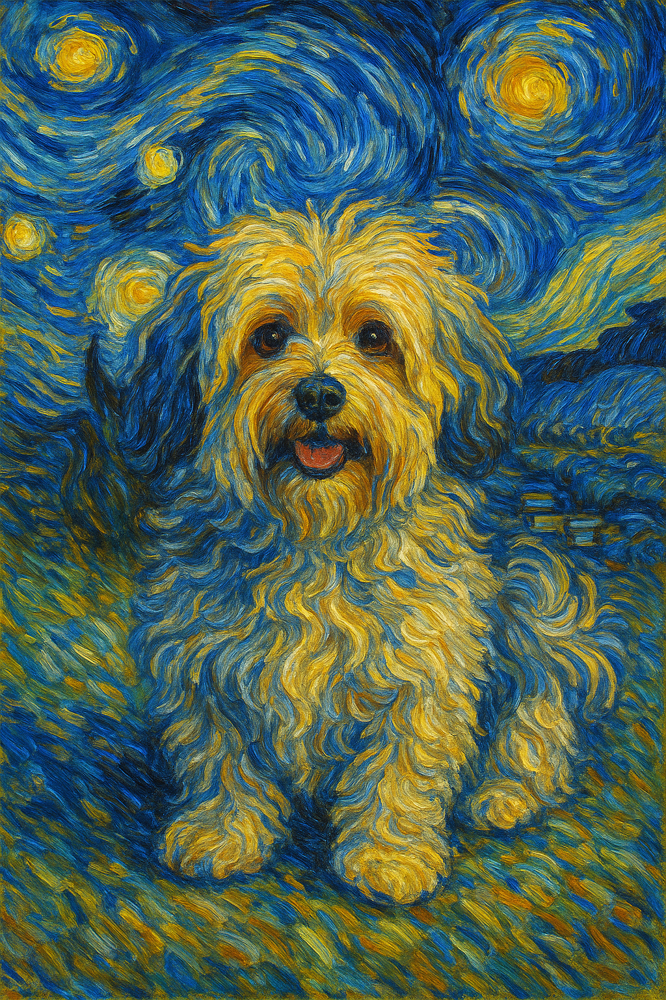

In [70]:
IPython.display.Image(vangogh_path, width=250)

In [71]:
davinci_path = (Path('resources') / 'outputs' / 
    'havanese_davinci.png')

In [72]:
create_image(client, davinci_path,
    'Havanese dog in the style of Leonardo DaVinci')

Image stored in:
resources/outputs/havanese_davinci.png


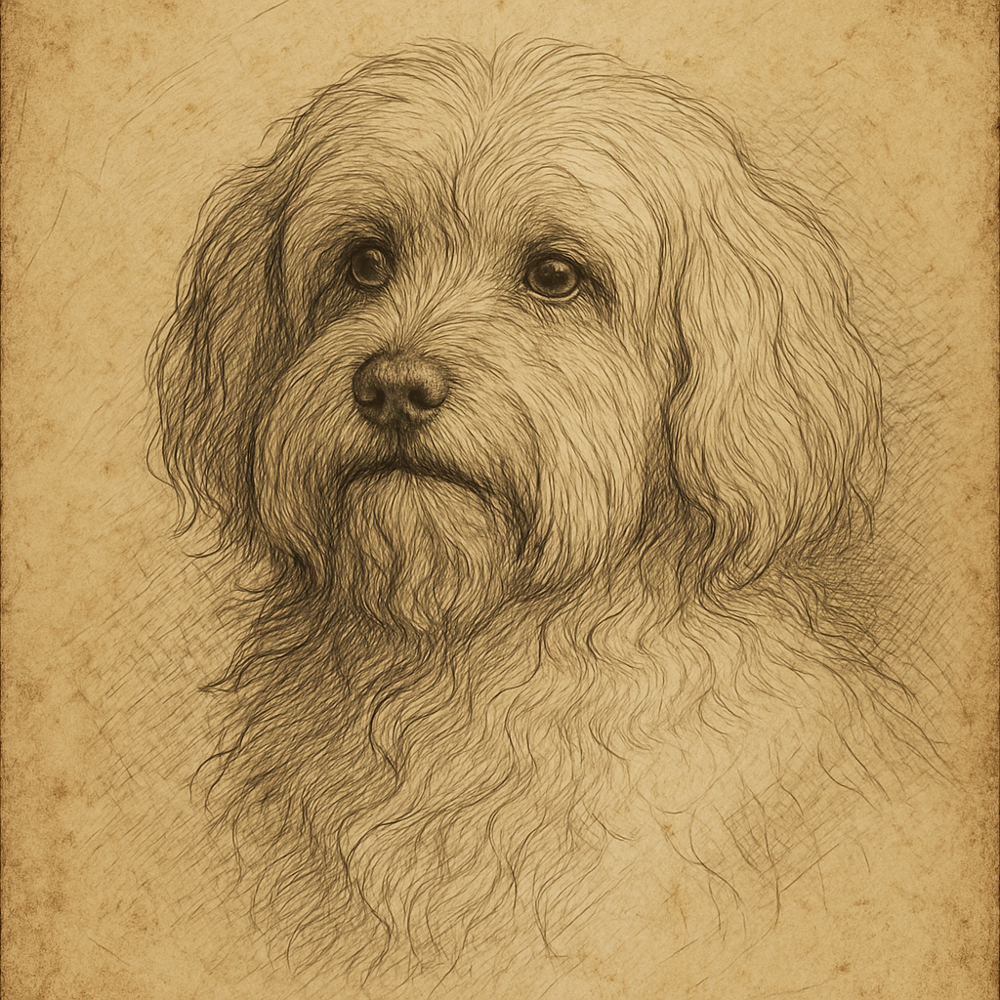

In [74]:
IPython.display.Image(davinci_path, width=250)

# Image Style Transfer 
## Style Transfer via the Images API’s Edit Capability and a Style-Transfer Prompt

### Style-Transfer Prompt

In [75]:
style_transfer_prompt = """
    Restyle the input photo into a vibrant swirling impasto 
    painting inspired by post-impressionist brushwork.  
    
    Medium/technique: thick acrylic paint with bold 
    palette-knife swipes and loaded brush strokes; swirling 
    arcs, rhythmic curves, comma-shaped dabs, and layered 
    ridges that give a tactile sheen (impasto).  
    
    Palette: luminous cobalt and ultramarine blues as the 
    dominant field; strong accents of golden yellow and amber; 
    secondary touches of teal and turquoise; minimal orange and 
    white highlights for contrast.  
    
    Composition: shallow depth, decorative and poster-flat; 
    energetic all-over brushwork that simplifies the subject 
    into flowing, abstracted shapes; swirls and curved strokes
    define contours and fur without precise detail.  
    
    Lighting & finish: very saturated, high contrast, minimal 
    shading; painterly, non-photorealistic.  
    
    Do/Don’t: maintain subject recognizability by silhouette and 
    major proportions; no text; no signature; avoid fine line 
    drawing or photoreal textures."""

### Restyling the Photo

In [76]:
photo_path = Path('resources') / 'sunset.jpg'

In [77]:
output_path = (Path('resources') / 'outputs' /
    'styled_sunset.png')

In [78]:
from image_edits import restyle_with_images_api

In [79]:
restyle_with_images_api(client, photo_path, 
    output_path, '1536x1024', style_transfer_prompt)

Image stored in:
resources/outputs/styled_sunset.png


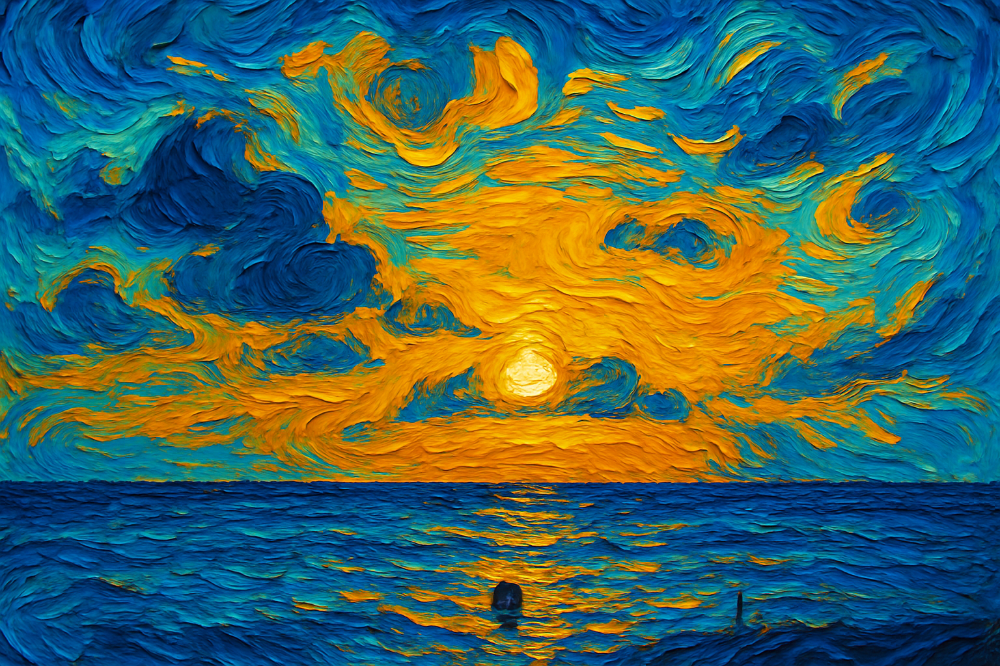

In [80]:
IPython.display.Image(output_path, width=400)

## Style Transfer Via the Responses API’s Image Generation Tool

In [81]:
style_path = Path('resources') / 'style1.jpg'

In [82]:
output_path = (Path('resources') / 'outputs' /
    'styled_sunset_from_style1_image.png')

In [83]:
from image_edits import restyle_with_responses_api

In [84]:
restyle_with_responses_api(client, photo_path, style_path, 
    output_path, size='1536x1024')

Image stored in:
resources/outputs/styled_sunset_from_style1_image.png


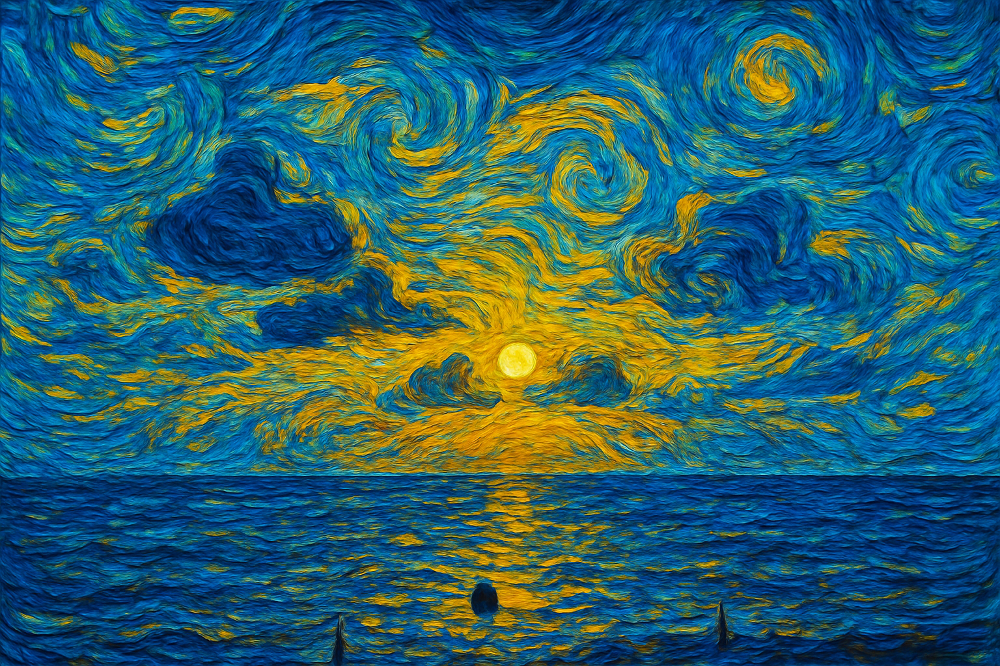

In [85]:
IPython.display.Image(output_path, width=400)

# Generating Closed Captions from a Video’s Audio Track

In [86]:
audio_path = Path('resources') / 'Python2e_01_02.m4a'

In [87]:
from speech_to_vtt import speech_to_vtt

In [88]:
captions = speech_to_vtt(client, audio_path)

In [89]:
print(captions)

WEBVTT

00:00:00.000 --> 00:00:11.000
For our next test drive, we're going to take a look at executing a full Python program using the IPython interpreter at the command line once again.

00:00:11.000 --> 00:00:20.000
For the purpose of this particular demonstration, you are going to need to change into the examples folder containing the book's examples,

00:00:20.000 --> 00:00:26.000
and specifically the subfolder 01, which contains the stuff for this lesson.

00:00:26.000 --> 00:00:34.000
And in order to do that, I've provided the CD commands for Mac OS and Linux, as well as two different versions for Windows.

00:00:34.000 --> 00:00:43.000
So if you're a Mac OS or Linux user, you can use the shorthand tilde forward slash documents to go into your documents folder,

00:00:43.000 --> 00:00:48.000
and then the examples folder and the 01 folder.

00:00:48.000 --> 00:00:56.000
If you're on Windows, depending on which Anaconda command line you're using, the way that you change folders is 

In [90]:
vtt_path = Path('resources') / 'outputs' / 'Python2e_02_01.vtt'

In [91]:
with open(vtt_path, 'w') as vtt_file:
    print(captions, file=vtt_file)

# Content Moderation
### Demonstrating Moderation with a String That Is Not Flagged

In [92]:
from moderation import check_prompt, \
    display_moderation_results

In [93]:
result = check_prompt(client,
    'I would kill for an ice cream sundae right now.')

In [94]:
display_moderation_results(result)

Prompt not flagged for offensive content


### Demonstrating Moderation with a String That Is Flagged

In [95]:
result = check_prompt(client, "I'm going to make them pay.")

In [96]:
display_moderation_results(result)

Offensive content categories & scores:
               harassment: False 0.20
   harassment/threatening: False 0.33
                     hate: False 0.01
         hate/threatening: False 0.00
                  illicit: False 0.02
          illicit/violent: False 0.00
                self-harm: False 0.00
   self-harm/instructions: False 0.00
         self-harm/intent: False 0.00
                   sexual: False 0.00
            sexual/minors: False 0.00
                 violence:  True 0.40
         violence/graphic: False 0.00


## Passing Images to the Moderation API

In [ ]:
from moderation import check_image

In [ ]:
result = check_image(client, url) # Insert string URL of an image containing flaggable content

### Sample Output for a Self-Harm Image

> `Offensive content categories & scores:`  
> `               harassment: False 0.00`  
> `   harassment/threatening: False 0.00`  
> `                     hate: False 0.00`  
> `         hate/threatening: False 0.00`  
> `                  illicit: False 0.00`  
> `          illicit/violent: False 0.00`  
> **`                self-harm:  True 0.86`**  
> `   self-harm/instructions: False 0.00`  
> `         self-harm/intent: False 0.01`  
> `                   sexual: False 0.00`  
> `            sexual/minors: False 0.00`  
> **`                 violence:  True 0.60`**  
> `         violence/graphic: False 0.01`


# 
# 
# 
## Sora
* No API yet
## Azure OpenAI Sora API
* Access through certain regions' servers (e.g., US East 2)
## Other Video GenAIs
* Adobe Firefly (https://firefly.adobe.com) 
* Meta Movie Gen (https://ai.meta.com/research/movie-gen/) 
* Google’s Veo 3 (https://deepmind.google/models/veo/) 
* InVideo (https://invideo.io/) 

<hr/>
&copy; 2025 by Deitel & Associates, Inc. All Rights Reserved. 